In [ ]:
import os
os.environ.setdefault("TF_CPP_MIN_LOG_LEVEL", "2")  # Report only TF errors by default
import tensorflow as tf
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
from dataset import Dataset
from pipeline import Pipeline
from visualizations import Visualizer
from sklearn.linear_model import Ridge
import sklearn.preprocessing
from sklearn.svm import LinearSVR, SVR
from sklearn.decomposition import PCA, KernelPCA
from scikeras.wrappers import KerasRegressor
from sklearn.metrics import mean_squared_error
from sktime.performance_metrics.forecasting import mean_squared_percentage_error
from sktime.performance_metrics.forecasting import MeanSquaredError
rmse = MeanSquaredError(square_root = True)
from scipy.linalg import LinAlgWarning
import sklearn.model_selection
import warnings
# Filter out LinAlgWarning
warnings.filterwarnings("ignore", category=LinAlgWarning)
#controling whether tensorflow does recognize GPU
tf.config.get_visible_devices("GPU")
np.random.seed(42)
tf.random.set_seed(42)

In [ ]:
#Inititate processing pipeline
pipeline = Pipeline(crypto_tick = "btc", returns=True)
#Initiate visualizer
visualizer = Visualizer()

In [ ]:
# print("Missing values distribution:")
# visualizer.get_missing_columns(data = pipeline.data)

In [ ]:
# fig = visualizer.draw_missing_data(data = pipeline.data)
# plt.tight_layout()
# fig.savefig("./../text/Figures/BTC_missing_1.pdf", dpi=300, format="pdf")

# fig.show()

In [ ]:
pipeline.set_beginning(start_date = "2014-9-17")

In [ ]:
# fig = visualizer.draw_missing_data(data = pipeline.data)
# plt.tight_layout()
# fig.savefig("../text/Figures/BTC_missing_2.pdf", dpi=300, format="pdf")
# fig.show()

In [ ]:
pipeline.preprocess_dataset()

In [ ]:
# fig = visualizer.draw_missing_data(data = pipeline.data)
# fig.show()

In [ ]:
pipeline.data.columns

Index(['BTC / Addresses, active, count', 'BTC / NVT, adjusted, 90d MA',
       'BTC / NVT, adjusted, free float,  90d MA', 'BTC / NVT, adjusted',
       'BTC / NVT, adjusted, free float', 'BTC / Flow, in, to exchanges, USD',
       'BTC / Flow, out, from exchanges, USD',
       'BTC / Fees, transaction, mean, USD',
       'BTC / Fees, transaction, median, USD', 'BTC / Fees, total, USD',
       'BTC / Miner revenue, USD',
       'BTC / Capitalization, market, free float, USD',
       'BTC / Capitalization, realized, USD',
       'BTC / Capitalization, market, current supply, USD',
       'BTC / Capitalization, market, estimated supply, USD',
       'BTC / Volatility, daily returns, 30d',
       'BTC / Volatility, daily returns, 180d', 'BTC / Difficulty, last',
       'BTC / Difficulty, mean', 'BTC / Hash rate, mean',
       'BTC / Hash rate, mean, 30d', 'BTC / Revenue, per hash unit, USD',
       'BTC / Supply, Miner, held by all mining entities, USD',
       'BTC / Block, size, mean, b

In [ ]:
pipeline.data.drop(columns = ['BTC / NVT, adjusted, free float,  90d MA',
                              'BTC / NVT, adjusted, free float',
                              'BTC / Fees, transaction, median, USD', 'BTC / Fees, total, USD',
                              'BTC / Capitalization, market, free float, USD',
                              'BTC / Capitalization, market, current supply, USD',
                              'BTC / Capitalization, market, estimated supply, USD',
                              'BTC / Difficulty, mean',
                              'BTC / Hash rate, mean, 30d',
                              'BTC / Transactions, transfers, count',
                            'BTC / Transactions, transfers, value, mean, USD'
                              ], inplace = True)

In [ ]:
pipeline.shift_target()

# Creating results table

In [ ]:
columns = ["BTC-LR - 1 day", "BTC-LR - 5 days", 
           "BTC-LR - 10 days", "BTC-SVR - 1 day", "BTC-SVR - 5 days", 
           "BTC-SVR - 10 days", "BTC-LSTM - 1 day", "BTC-LSTM - 5 days","BTC-LSTM - 10 days", "Naive forceast - 1 day", "Naive forceast - 5 days",
           "Naive forceast - 10 days"]
rows = ["Full dimensionality", "95% retained variance",
        "98% retained variance", "99% retained variance"]
#presented in RMSE which is the optimized metric
results_train_averaged = pd.DataFrame(columns = columns, index = rows).fillna(0).astype(int)

In [ ]:
columns = ["BTC-LR - 1 day", "BTC-LR - 5 days", 
           "BTC-LR - 10 days", "BTC-SVR - 1 day", "BTC-SVR - 5 days", "BTC-SVR - 10 days", 
           "BTC-LSTM - 1 day", "BTC-LSTM - 5 days","BTC-LSTM - 10 days", "Naive forceast - 1 day", "Naive forceast - 5 days",
           "Naive forceast - 10 days"]
rows = ["Full dimensionality", "95% retained variance",
        "98% retained variance", "99% retained variance"]
#presented in RMSE which is the optimized metric
results_test = pd.DataFrame(columns = columns, index = rows).fillna(0).astype(int)

# Naive forecast baseline (predicting current price)

In [ ]:
train_data_1, test_data_1, train_target_1, test_target_1 = Pipeline.split_train_test(pipeline.data_1d_shift.copy())
train_data_5, test_data_5, train_target_5, test_target_5 = Pipeline.split_train_test(pipeline.data_5d_shift.copy())
train_data_10, test_data_10, train_target_10, test_target_10 = Pipeline.split_train_test(pipeline.data_10d_shift.copy())
results_train_averaged["Naive forceast - 1 day"] = rmse(train_target_1, train_data_1.iloc[:,-1])
results_train_averaged["Naive forceast - 5 days"] = rmse(train_target_5, train_data_5.iloc[:,-1])
results_train_averaged["Naive forceast - 10 days"] = rmse(train_target_10, train_data_10.iloc[:,-1])
results_test["Naive forceast - 1 day"] = rmse(test_target_1, test_data_1.iloc[:,-1])
results_test["Naive forceast - 5 days"] = rmse(test_target_5, test_data_5.iloc[:,-1])
results_test["Naive forceast - 10 days"] = rmse(test_target_10, test_data_10.iloc[:,-1])


/home/tomas_barhon/Code/Bachelor thesis/Bachelor_Thesis/lib/python3.11/site-packages/sktime/performance_metrics/forecasting/_classes.py:477: UserWarning: y_pred and y_true do not have the same column index. This may indicate incorrect objects passed to the metric. Indices of y_true will be used for y_pred.
  warn(
/home/tomas_barhon/Code/Bachelor thesis/Bachelor_Thesis/lib/python3.11/site-packages/sktime/performance_metrics/forecasting/_classes.py:477: UserWarning: y_pred and y_true do not have the same column index. This may indicate incorrect objects passed to the metric. Indices of y_true will be used for y_pred.
  warn(
/home/tomas_barhon/Code/Bachelor thesis/Bachelor_Thesis/lib/python3.11/site-packages/sktime/performance_metrics/forecasting/_classes.py:477: UserWarning: y_pred and y_true do not have the same column index. This may indicate incorrect objects passed to the metric. Indices of y_true will be used for y_pred.
  warn(
/home/tomas_barhon/Code/Bachelor thesis/Bachelor_The

# PCA retained variance on the whole dataset

In [ ]:
# pca = PCA(random_state = 42)
# scaler = sklearn.preprocessing.RobustScaler(unit_variance = True)
# pca.fit_transform(scaler.fit_transform(pipeline.data_1d_shift.copy().iloc[:,:-1]))
# fig = visualizer.draw_cumulative_varience_ratios(np.cumsum(pca.explained_variance_ratio_))
# plt.tight_layout()
# fig.savefig("../text/Figures/PCA_retained_variance.pdf", dpi=300, format="pdf")
# fig.show()

In [ ]:
# print("Explained variance by component")
# pca.explained_variance_ratio_

# Full dimensionality - baseline models

The pipeline is always shown for 1 day forecasting. 5 and 10 day forecasting is performed without further comments 

## Full dimensionality - Linear Regression

In [ ]:
pipe = Pipeline.assembly_pipeline(estimator = Ridge(random_state = 42), dim_reducer = None)
pipe

Pipeline(steps=[('pack_down', None),
                ('scaler', RobustScaler(unit_variance=True)),
                ('denoiser', None), ('scaler 2', None), ('pack_up,', None),
                ('estimator', Ridge(random_state=42))])

In [ ]:
LR_PARAMETERS = {"estimator__alpha": np.linspace(0,5,20),
              "estimator__tol":[0.0001, 0.0005,0.001],
              "estimator__max_iter":[200,500,1000,2000,5000,10000]}
train_data, test_data, train_target, test_target = Pipeline.split_train_test(pipeline.data_1d_shift.copy())
model = Pipeline.fit_grid_search(train_data, train_target, pipe, LR_PARAMETERS)
results_train_averaged.loc[["Full dimensionality"],["BTC-LR - 1 day"]] = model.best_score_
prediction = model.predict(test_data)
results_test.loc[["Full dimensionality"],["BTC-LR - 1 day"]] = rmse(test_target,
                                                                prediction)

/tmp/ipykernel_48349/624547649.py:6: FutureWarning: Setting an item of incompatible dtype is deprecated and will raise in a future error of pandas. Value '-1822.411893918866' has dtype incompatible with int64, please explicitly cast to a compatible dtype first.
  results_train_averaged.loc[["Full dimensionality"],["BTC-LR - 1 day"]] = model.best_score_
/home/tomas_barhon/Code/Bachelor thesis/Bachelor_Thesis/lib/python3.11/site-packages/sktime/performance_metrics/forecasting/_classes.py:465: UserWarning: y_pred and y_true do not have the same row index. This may indicate incorrect objects passed to the metric. Indices of y_true will be used for y_pred.
  warn(
/home/tomas_barhon/Code/Bachelor thesis/Bachelor_Thesis/lib/python3.11/site-packages/sktime/performance_metrics/forecasting/_classes.py:477: UserWarning: y_pred and y_true do not have the same column index. This may indicate incorrect objects passed to the metric. Indices of y_true will be used for y_pred.
  warn(
/tmp/ipykernel_4

## Full dimensionality - 5 and 10 days - LR

In [ ]:
#5 days LR
pipe = Pipeline.assembly_pipeline(estimator = Ridge(random_state = 42), dim_reducer = None)
train_data, test_data, train_target, test_target = Pipeline.split_train_test(pipeline.data_5d_shift.copy())
model = Pipeline.fit_grid_search(train_data, train_target, pipe, LR_PARAMETERS)
results_train_averaged.loc[["Full dimensionality"],["BTC-LR - 5 days"]] = model.best_score_
prediction = model.predict(test_data)
results_test.loc[["Full dimensionality"],["BTC-LR - 5 days"]] = rmse(test_target,
                                                                prediction)
#10 days LR
pipe = Pipeline.assembly_pipeline(estimator = Ridge(random_state = 42), dim_reducer = None)
train_data, test_data, train_target, test_target = Pipeline.split_train_test(pipeline.data_10d_shift.copy())
model = Pipeline.fit_grid_search(train_data, train_target, pipe, LR_PARAMETERS)
results_train_averaged.loc[["Full dimensionality"],["BTC-LR - 10 days"]] = model.best_score_
prediction = model.predict(test_data)
results_test.loc[["Full dimensionality"],["BTC-LR - 10 days"]] = rmse(test_target,
                                                                prediction)

/tmp/ipykernel_48349/1367942371.py:5: FutureWarning: Setting an item of incompatible dtype is deprecated and will raise in a future error of pandas. Value '-5045.375357900005' has dtype incompatible with int64, please explicitly cast to a compatible dtype first.
  results_train_averaged.loc[["Full dimensionality"],["BTC-LR - 5 days"]] = model.best_score_
/home/tomas_barhon/Code/Bachelor thesis/Bachelor_Thesis/lib/python3.11/site-packages/sktime/performance_metrics/forecasting/_classes.py:465: UserWarning: y_pred and y_true do not have the same row index. This may indicate incorrect objects passed to the metric. Indices of y_true will be used for y_pred.
  warn(
/home/tomas_barhon/Code/Bachelor thesis/Bachelor_Thesis/lib/python3.11/site-packages/sktime/performance_metrics/forecasting/_classes.py:477: UserWarning: y_pred and y_true do not have the same column index. This may indicate incorrect objects passed to the metric. Indices of y_true will be used for y_pred.
  warn(
/tmp/ipykernel

## Full dimensionality - Support Vector Regression

In [ ]:
pipe = Pipeline.assembly_pipeline(estimator = LinearSVR(random_state = 42), dim_reducer = None)
pipe

Pipeline(steps=[('pack_down', None),
                ('scaler', RobustScaler(unit_variance=True)),
                ('denoiser', None), ('scaler 2', None), ('pack_up,', None),
                ('estimator', LinearSVR(random_state=42))])

In [ ]:
SVR_PARAMETERS = {"estimator__C": np.logspace(-10,5,10),
    "estimator__epsilon": np.linspace(0.01,0.1,10),
              "estimator__tol":[0.00005,0.0001, 0.0005,0.001],
              "estimator__max_iter":[1000,2000,2500,5000,10000]}
train_data, test_data, train_target, test_target = Pipeline.split_train_test(pipeline.data_1d_shift.copy())
model = Pipeline.fit_grid_search(train_data, train_target, pipe, SVR_PARAMETERS)
results_train_averaged.loc[["Full dimensionality"],["BTC-SVR - 1 day"]] = model.best_score_
prediction = model.predict(test_data)
results_test.loc[["Full dimensionality"],["BTC-SVR - 1 day"]] = rmse(test_target,
                                                                prediction)

/home/tomas_barhon/Code/Bachelor thesis/Bachelor_Thesis/lib/python3.11/site-packages/sklearn/svm/_classes.py:32: FutureWarning: The default value of `dual` will change from `True` to `'auto'` in 1.5. Set the value of `dual` explicitly to suppress the warning.
  warnings.warn(
/home/tomas_barhon/Code/Bachelor thesis/Bachelor_Thesis/lib/python3.11/site-packages/sklearn/svm/_classes.py:32: FutureWarning: The default value of `dual` will change from `True` to `'auto'` in 1.5. Set the value of `dual` explicitly to suppress the warning.
  warnings.warn(
/home/tomas_barhon/Code/Bachelor thesis/Bachelor_Thesis/lib/python3.11/site-packages/sklearn/svm/_classes.py:32: FutureWarning: The default value of `dual` will change from `True` to `'auto'` in 1.5. Set the value of `dual` explicitly to suppress the warning.
  warnings.warn(
/home/tomas_barhon/Code/Bachelor thesis/Bachelor_Thesis/lib/python3.11/site-packages/sklearn/svm/_classes.py:32: FutureWarning: The default value of `dual` will change f

In [ ]:
print(model.best_params_)
print(model.best_estimator_)
print(model.best_score_)

{'estimator__C': 2154.4346900318865, 'estimator__epsilon': 0.1, 'estimator__max_iter': 2500, 'estimator__tol': 5e-05}
Pipeline(steps=[('pack_down', None),
                ('scaler', RobustScaler(unit_variance=True)),
                ('denoiser', None), ('scaler 2', None), ('pack_up,', None),
                ('estimator',
                 LinearSVR(C=2154.4346900318865, epsilon=0.1, max_iter=2500,
                           random_state=42, tol=5e-05))])
-1061.5313440187022


## Full dimensionality - 5 and 10 days - SVR

In [ ]:
#5 days SVR
pipe = Pipeline.assembly_pipeline(estimator = LinearSVR(random_state = 42), dim_reducer = None)
train_data, test_data, train_target, test_target = Pipeline.split_train_test(pipeline.data_5d_shift.copy())
model = Pipeline.fit_grid_search(train_data, train_target, pipe, SVR_PARAMETERS)
results_train_averaged.loc[["Full dimensionality"],["BTC-SVR - 5 days"]] = model.best_score_
prediction = model.predict(test_data)
results_test.loc[["Full dimensionality"],["BTC-SVR - 5 days"]] = rmse(test_target,
                                                                prediction)

#10 days SVR
pipe = Pipeline.assembly_pipeline(estimator = LinearSVR(random_state = 42), dim_reducer = None)
train_data, test_data, train_target, test_target = Pipeline.split_train_test(pipeline.data_10d_shift.copy())
model = Pipeline.fit_grid_search(train_data, train_target, pipe, SVR_PARAMETERS)
results_train_averaged.loc[["Full dimensionality"],["BTC-SVR - 10 days"]] = model.best_score_
prediction = model.predict(test_data)
results_test.loc[["Full dimensionality"],["BTC-SVR - 10 days"]] = rmse(test_target,
                                                                prediction)


/home/tomas_barhon/Code/Bachelor thesis/Bachelor_Thesis/lib/python3.11/site-packages/sklearn/svm/_classes.py:32: FutureWarning: The default value of `dual` will change from `True` to `'auto'` in 1.5. Set the value of `dual` explicitly to suppress the warning.
  warnings.warn(
/home/tomas_barhon/Code/Bachelor thesis/Bachelor_Thesis/lib/python3.11/site-packages/sklearn/svm/_classes.py:32: FutureWarning: The default value of `dual` will change from `True` to `'auto'` in 1.5. Set the value of `dual` explicitly to suppress the warning.
  warnings.warn(
/home/tomas_barhon/Code/Bachelor thesis/Bachelor_Thesis/lib/python3.11/site-packages/sklearn/svm/_classes.py:32: FutureWarning: The default value of `dual` will change from `True` to `'auto'` in 1.5. Set the value of `dual` explicitly to suppress the warning.
  warnings.warn(
/home/tomas_barhon/Code/Bachelor thesis/Bachelor_Thesis/lib/python3.11/site-packages/sklearn/svm/_classes.py:32: FutureWarning: The default value of `dual` will change f

/tmp/ipykernel_48349/2488864839.py:5: UserWarning: FigureCanvasAgg is non-interactive, and thus cannot be shown
  fig.show()


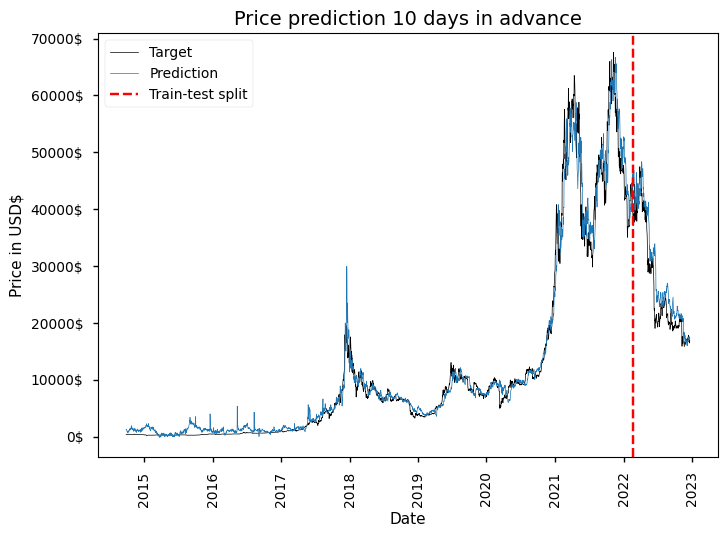

In [ ]:
test_prediction = pd.Series(prediction, index=test_data.index)
train_pred = pd.Series(model.predict(train_data), index=train_data.index)
visualizer = Visualizer()
fig = visualizer.draw_prediction_full(train_target,train_pred, test_target, test_prediction, 10)
fig.show()

/tmp/ipykernel_48349/4071368209.py:2: UserWarning: FigureCanvasAgg is non-interactive, and thus cannot be shown
  fig.show()


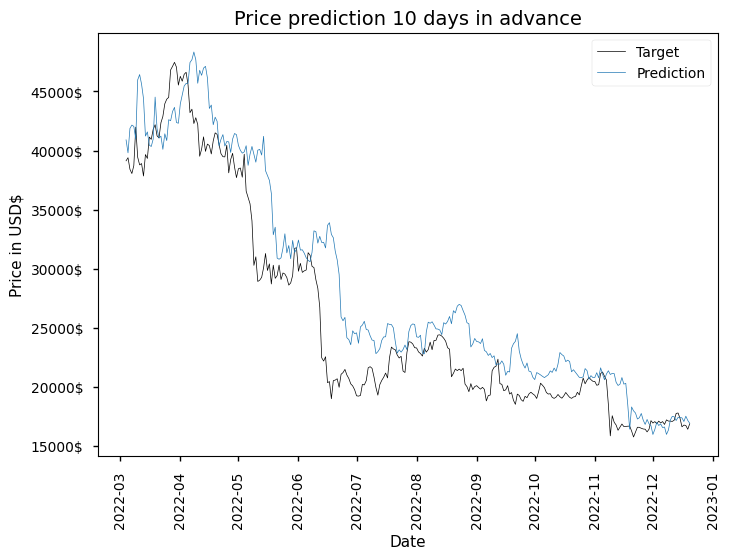

In [ ]:
fig = visualizer.draw_prediction_test(test_target, test_prediction, 10)
fig.show()

## Full dimensionality - LTSM


In [ ]:
len(pipeline.data_1d_shift.columns)

42

In [ ]:
pipeline.data_1d_shift.columns

Index(['BTC / Addresses, active, count', 'BTC / NVT, adjusted, 90d MA',
       'BTC / NVT, adjusted', 'BTC / Flow, in, to exchanges, USD',
       'BTC / Flow, out, from exchanges, USD',
       'BTC / Fees, transaction, mean, USD', 'BTC / Miner revenue, USD',
       'BTC / Capitalization, realized, USD',
       'BTC / Volatility, daily returns, 30d',
       'BTC / Volatility, daily returns, 180d', 'BTC / Difficulty, last',
       'BTC / Hash rate, mean', 'BTC / Revenue, per hash unit, USD',
       'BTC / Supply, Miner, held by all mining entities, USD',
       'BTC / Block, size, mean, bytes', 'BTC / Block, weight, mean',
       'BTC / Issuance, continuous, percent, daily',
       'BTC / Network distribution factor', 'BTC / Transactions, count',
       'Google_btc_search', 'Wiki_btc_search', 'Close_^DJI', 'Close_^GSPC',
       'Close_GC=F', 'Close_^VIX', 'Close_^IXIC', 'Close_SMH', 'Close_VGT',
       'Close_XSD', 'Close_IYW', 'Close_FTEC', 'Close_IGV', 'Close_QQQ',
       'Google_crypt

In [ ]:
pipe = Pipeline.assembly_pipeline(estimator = KerasRegressor(build_fn = Pipeline.assembly_lstm,
                    verbose=1, random_state = 42, shuffle = True, 
                    batch_size = 200,epochs=300, input_shape=(6, 41),
                    units = 500), dim_reducer = None, shape_change = ((-1, 41), (-1,6,41)))
pipe

Pipeline(steps=[('pack_down', ReshapeTransformer(new_shape=(-1, 41))),
                ('scaler', RobustScaler(unit_variance=True)),
                ('denoiser', None), ('scaler 2', None),
                ('pack_up,', ReshapeTransformer(new_shape=(-1, 6, 41))),
                ('estimator',
                 KerasRegressor(batch_size=200, build_fn=<function Pipeline.assembly_lstm at 0x7f4be8c85300>, epochs=300, input_shape=(6, 41), random_state=42, units=500))])

In [ ]:
LSTM_PARAMETERS = {"estimator__units": np.linspace(5, 1000, 5, dtype = int),
    "estimator__epochs": np.linspace(20, 500, 5, dtype = int),
    "estimator__batch_size": [5, 10, 50, 100, 200],
    "estimator__shuffle": [True, False]}
x,y = Pipeline.create_lstm_input(pipeline.data_1d_shift.copy(), pipeline.data_1d_shift.copy().iloc[:,-1], 6)
train_data, test_data, train_target, test_target = Pipeline.split_train_test([x,y], pandas = False)
minimax = sklearn.preprocessing.MinMaxScaler((0,1))
train_target = np.squeeze(minimax.fit_transform(train_target.reshape(-1, 1)))
test_target = np.squeeze(minimax.transform(test_target.reshape(-1, 1)))
model = Pipeline.fit_grid_search(train_data, train_target, pipe, LSTM_PARAMETERS, n_jobs =None)
results_train_averaged.loc[["Full dimensionality"],["BTC-LSTM - 1 day"]] = rmse(minimax.inverse_transform(train_target.reshape(-1,1)), minimax.inverse_transform(model.predict(train_data).reshape(-1,1)))
prediction = model.predict(test_data)
results_test.loc[["Full dimensionality"],["BTC-LSTM - 1 day"]] = rmse(minimax.inverse_transform(test_target.reshape(-1,1)), 
                                                                      minimax.inverse_transform(model.predict(test_data).reshape(-1,1)))

/home/tomas_barhon/Code/Bachelor thesis/Bachelor_Thesis/lib/python3.11/site-packages/scikeras/wrappers.py:915: UserWarning: ``build_fn`` will be renamed to ``model`` in a future release, at which point use of ``build_fn`` will raise an Error instead.
  X, y = self._initialize(X, y)


Epoch 1/20
182/182 [==============================] - 8s 9ms/step - loss: 0.2393
Epoch 2/20
182/182 [==============================] - 2s 8ms/step - loss: 0.0980
Epoch 3/20
182/182 [==============================] - 1s 8ms/step - loss: 0.0588
Epoch 4/20
182/182 [==============================] - 1s 7ms/step - loss: 0.0434
Epoch 5/20
182/182 [==============================] - 1s 7ms/step - loss: 0.0293
Epoch 6/20
182/182 [==============================] - 1s 7ms/step - loss: 0.0237
Epoch 7/20
182/182 [==============================] - 1s 7ms/step - loss: 0.0174
Epoch 8/20
182/182 [==============================] - 1s 7ms/step - loss: 0.0134
Epoch 9/20
182/182 [==============================] - 1s 8ms/step - loss: 0.0114
Epoch 10/20
182/182 [==============================] - 2s 9ms/step - loss: 0.0094
Epoch 11/20
182/182 [==============================] - 1s 8ms/step - loss: 0.0086
Epoch 12/20
182/182 [==============================] - 2s 8ms/step - loss: 0.0070
Epoch 13/20
182/182 [====

/home/tomas_barhon/Code/Bachelor thesis/Bachelor_Thesis/lib/python3.11/site-packages/scikeras/wrappers.py:915: UserWarning: ``build_fn`` will be renamed to ``model`` in a future release, at which point use of ``build_fn`` will raise an Error instead.
  X, y = self._initialize(X, y)


Epoch 1/20
363/363 [==============================] - 6s 8ms/step - loss: 0.1599
Epoch 2/20
363/363 [==============================] - 3s 9ms/step - loss: 0.0588
Epoch 3/20
363/363 [==============================] - 3s 8ms/step - loss: 0.0417
Epoch 4/20
363/363 [==============================] - 3s 8ms/step - loss: 0.0319
Epoch 5/20
363/363 [==============================] - 3s 8ms/step - loss: 0.0269
Epoch 6/20
363/363 [==============================] - 3s 8ms/step - loss: 0.0230
Epoch 7/20
363/363 [==============================] - 3s 8ms/step - loss: 0.0214
Epoch 8/20
363/363 [==============================] - 3s 8ms/step - loss: 0.0186
Epoch 9/20
363/363 [==============================] - 3s 8ms/step - loss: 0.0169
Epoch 10/20
363/363 [==============================] - 3s 8ms/step - loss: 0.0151
Epoch 11/20
363/363 [==============================] - 3s 8ms/step - loss: 0.0157
Epoch 12/20
363/363 [==============================] - 3s 8ms/step - loss: 0.0143
Epoch 13/20
363/363 [====

/home/tomas_barhon/Code/Bachelor thesis/Bachelor_Thesis/lib/python3.11/site-packages/scikeras/wrappers.py:915: UserWarning: ``build_fn`` will be renamed to ``model`` in a future release, at which point use of ``build_fn`` will raise an Error instead.
  X, y = self._initialize(X, y)


Epoch 1/20
182/182 [==============================] - 5s 9ms/step - loss: 0.2840
Epoch 2/20
182/182 [==============================] - 2s 9ms/step - loss: 0.0355
Epoch 3/20
182/182 [==============================] - 2s 9ms/step - loss: 0.0073
Epoch 4/20
182/182 [==============================] - 2s 8ms/step - loss: 0.0030
Epoch 5/20
182/182 [==============================] - 2s 9ms/step - loss: 0.0021
Epoch 6/20
182/182 [==============================] - 2s 8ms/step - loss: 0.0016
Epoch 7/20
182/182 [==============================] - 2s 8ms/step - loss: 0.0013
Epoch 8/20
182/182 [==============================] - 2s 9ms/step - loss: 0.0011
Epoch 9/20
182/182 [==============================] - 2s 9ms/step - loss: 0.0010
Epoch 10/20
182/182 [==============================] - 2s 9ms/step - loss: 9.9965e-04
Epoch 11/20
182/182 [==============================] - 2s 9ms/step - loss: 9.1032e-04
Epoch 12/20
182/182 [==============================] - 2s 9ms/step - loss: 8.2679e-04
Epoch 13/20
1

/home/tomas_barhon/Code/Bachelor thesis/Bachelor_Thesis/lib/python3.11/site-packages/scikeras/wrappers.py:915: UserWarning: ``build_fn`` will be renamed to ``model`` in a future release, at which point use of ``build_fn`` will raise an Error instead.
  X, y = self._initialize(X, y)


Epoch 1/20
363/363 [==============================] - 6s 9ms/step - loss: 0.1528
Epoch 2/20
363/363 [==============================] - 3s 9ms/step - loss: 0.0195
Epoch 3/20
363/363 [==============================] - 3s 8ms/step - loss: 0.0148
Epoch 4/20
363/363 [==============================] - 3s 9ms/step - loss: 0.0129
Epoch 5/20
363/363 [==============================] - 3s 8ms/step - loss: 0.0124
Epoch 6/20
363/363 [==============================] - 3s 8ms/step - loss: 0.0104
Epoch 7/20
363/363 [==============================] - 3s 8ms/step - loss: 0.0099
Epoch 8/20
363/363 [==============================] - 3s 8ms/step - loss: 0.0093
Epoch 9/20
363/363 [==============================] - 3s 8ms/step - loss: 0.0092
Epoch 10/20
363/363 [==============================] - 3s 8ms/step - loss: 0.0093
Epoch 11/20
363/363 [==============================] - 3s 8ms/step - loss: 0.0090
Epoch 12/20
363/363 [==============================] - 3s 8ms/step - loss: 0.0090
Epoch 13/20
363/363 [====

/home/tomas_barhon/Code/Bachelor thesis/Bachelor_Thesis/lib/python3.11/site-packages/scikeras/wrappers.py:915: UserWarning: ``build_fn`` will be renamed to ``model`` in a future release, at which point use of ``build_fn`` will raise an Error instead.
  X, y = self._initialize(X, y)


Epoch 1/20
182/182 [==============================] - 6s 10ms/step - loss: 0.2964
Epoch 2/20
182/182 [==============================] - 2s 8ms/step - loss: 0.0360
Epoch 3/20
182/182 [==============================] - 2s 8ms/step - loss: 0.0054
Epoch 4/20
182/182 [==============================] - 1s 8ms/step - loss: 0.0021
Epoch 5/20
182/182 [==============================] - 1s 8ms/step - loss: 0.0015
Epoch 6/20
182/182 [==============================] - 2s 8ms/step - loss: 0.0013
Epoch 7/20
182/182 [==============================] - 1s 8ms/step - loss: 0.0010
Epoch 8/20
182/182 [==============================] - 1s 8ms/step - loss: 0.0011
Epoch 9/20
182/182 [==============================] - 2s 8ms/step - loss: 8.6050e-04
Epoch 10/20
182/182 [==============================] - 2s 9ms/step - loss: 9.4979e-04
Epoch 11/20
182/182 [==============================] - 2s 8ms/step - loss: 7.4067e-04
Epoch 12/20
182/182 [==============================] - 1s 8ms/step - loss: 6.9232e-04
Epoch 13

/home/tomas_barhon/Code/Bachelor thesis/Bachelor_Thesis/lib/python3.11/site-packages/scikeras/wrappers.py:915: UserWarning: ``build_fn`` will be renamed to ``model`` in a future release, at which point use of ``build_fn`` will raise an Error instead.
  X, y = self._initialize(X, y)


Epoch 1/20
363/363 [==============================] - 6s 10ms/step - loss: 0.1448
Epoch 2/20
363/363 [==============================] - 3s 9ms/step - loss: 0.0196
Epoch 3/20
363/363 [==============================] - 3s 9ms/step - loss: 0.0151
Epoch 4/20
363/363 [==============================] - 3s 9ms/step - loss: 0.0135
Epoch 5/20
363/363 [==============================] - 3s 9ms/step - loss: 0.0129
Epoch 6/20
363/363 [==============================] - 3s 9ms/step - loss: 0.0117
Epoch 7/20
363/363 [==============================] - 3s 9ms/step - loss: 0.0104
Epoch 8/20
363/363 [==============================] - 3s 8ms/step - loss: 0.0102
Epoch 9/20
363/363 [==============================] - 3s 8ms/step - loss: 0.0097
Epoch 10/20
363/363 [==============================] - 3s 9ms/step - loss: 0.0100
Epoch 11/20
363/363 [==============================] - 3s 9ms/step - loss: 0.0112
Epoch 12/20
363/363 [==============================] - 3s 8ms/step - loss: 0.0093
Epoch 13/20
363/363 [===

/home/tomas_barhon/Code/Bachelor thesis/Bachelor_Thesis/lib/python3.11/site-packages/scikeras/wrappers.py:915: UserWarning: ``build_fn`` will be renamed to ``model`` in a future release, at which point use of ``build_fn`` will raise an Error instead.
  X, y = self._initialize(X, y)


Epoch 1/20
182/182 [==============================] - 6s 11ms/step - loss: 0.4132
Epoch 2/20
182/182 [==============================] - 2s 9ms/step - loss: 0.0111
Epoch 3/20
182/182 [==============================] - 2s 9ms/step - loss: 0.0018
Epoch 4/20
182/182 [==============================] - 2s 9ms/step - loss: 0.0014
Epoch 5/20
182/182 [==============================] - 2s 10ms/step - loss: 0.0012
Epoch 6/20
182/182 [==============================] - 2s 9ms/step - loss: 0.0011
Epoch 7/20
182/182 [==============================] - 2s 9ms/step - loss: 9.5415e-04
Epoch 8/20
182/182 [==============================] - 2s 9ms/step - loss: 9.0824e-04
Epoch 9/20
182/182 [==============================] - 2s 9ms/step - loss: 8.6795e-04
Epoch 10/20
182/182 [==============================] - 2s 9ms/step - loss: 8.4273e-04
Epoch 11/20
182/182 [==============================] - 2s 9ms/step - loss: 7.5391e-04
Epoch 12/20
182/182 [==============================] - 2s 9ms/step - loss: 8.0900e-04

/home/tomas_barhon/Code/Bachelor thesis/Bachelor_Thesis/lib/python3.11/site-packages/scikeras/wrappers.py:915: UserWarning: ``build_fn`` will be renamed to ``model`` in a future release, at which point use of ``build_fn`` will raise an Error instead.
  X, y = self._initialize(X, y)


Epoch 1/20
363/363 [==============================] - 7s 10ms/step - loss: 0.1551
Epoch 2/20
363/363 [==============================] - 3s 9ms/step - loss: 0.0204
Epoch 3/20
363/363 [==============================] - 3s 9ms/step - loss: 0.0166
Epoch 4/20
363/363 [==============================] - 3s 9ms/step - loss: 0.0149
Epoch 5/20
363/363 [==============================] - 3s 9ms/step - loss: 0.0137
Epoch 6/20
363/363 [==============================] - 3s 9ms/step - loss: 0.0123
Epoch 7/20
363/363 [==============================] - 4s 12ms/step - loss: 0.0119
Epoch 8/20
363/363 [==============================] - 4s 12ms/step - loss: 0.0118
Epoch 9/20
363/363 [==============================] - 3s 9ms/step - loss: 0.0145
Epoch 10/20
221/363 [=================>............] - ETA: 1s - loss: 0.0143

In [ ]:
model.best_params_
model.best_score_


-0.2486178885981099

2/2 [==============================] - 0s 4ms/step


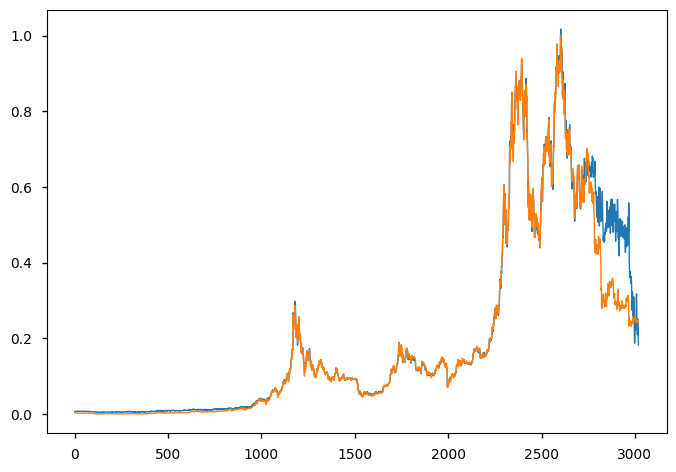

In [ ]:
plt.plot(np.concatenate([model.predict(train_data), model.predict(test_data)]), linewidth=1)
plt.plot(np.concatenate([train_target,test_target]), linewidth=1)

In [ ]:
results_train_averaged

,BTC-LR - 1 day,BTC-LR - 5 days,BTC-LR - 10 days,BTC-SVR - 1 day,BTC-SVR - 5 days,BTC-SVR - 10 days,BTC-LSTM - 1 day,BTC-LSTM - 5 days,BTC-LSTM - 10 days,Naive forceast - 1 day,Naive forceast - 5 days,Naive forceast - 10 days
Full dimensionality,-1600.7917,-4599.079811,-6115.906077,-938.02703,-2578.273139,-4655.219749,447.636127,NaN,NaN,781.932213,1734.914339,2501.060798
95% retained variance,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,781.932213,1734.914339,2501.060798
98% retained variance,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,781.932213,1734.914339,2501.060798
99% retained variance,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,781.932213,1734.914339,2501.060798


In [ ]:
results_test

,BTC-LR - 1 day,BTC-LR - 5 days,BTC-LR - 10 days,BTC-SVR - 1 day,BTC-SVR - 5 days,BTC-SVR - 10 days,BTC-LSTM - 1 day,BTC-LSTM - 5 days,BTC-LSTM - 10 days,Naive forceast - 1 day,Naive forceast - 5 days,Naive forceast - 10 days
Full dimensionality,973.139503,2403.181942,3786.815076,935.680342,2314.128935,3119.122371,10281.512152,NaN,NaN,905.500028,2068.261346,2985.21908
95% retained variance,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,905.500028,2068.261346,2985.21908
98% retained variance,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,905.500028,2068.261346,2985.21908
99% retained variance,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,905.500028,2068.261346,2985.21908


## Full dimensionality - 5 and 10 days - LSTM

In [ ]:
#5 days LSTM
pipe = Pipeline.assembly_pipeline(estimator = KerasRegressor(build_fn = Pipeline.assembly_lstm,
                    verbose=1, random_state = 42, shuffle = True, 
                    batch_size = 200,epochs=300, input_shape=(6, 52),
                    units = 500), dim_reducer = None, shape_change = ((-1, 52), (-1,6,52)))
x,y = Pipeline.create_lstm_input(pipeline.data_1d_shift.copy(), pipeline.data_1d_shift.copy().iloc[:,-1], 6)
train_data, test_data, train_target, test_target = Pipeline.split_train_test([x,y], pandas = False)
minimax = sklearn.preprocessing.MinMaxScaler((0,1))
train_target = np.squeeze(minimax.fit_transform(train_target.reshape(-1, 1)))
test_target = np.squeeze(minimax.transform(test_target.reshape(-1, 1)))
model = Pipeline.fit_grid_search(train_data, train_target, pipe, LSTM_PARAMETERS, n_jobs = None)
results_train_averaged.loc[["Full dimensionality"],["BTC-LSTM - 5 days"]] = model.best_score_
prediction = model.predict(test_data)
results_test.loc[["Full dimensionality"],["BTC-LSTM - 5 days"]] = rmse(minimax.inverse_transform(test_target.reshape(-1,1)), 
                                                                      minimax.inverse_transform(model.predict(test_data).reshape(-1,1)))
pipe = Pipeline.assembly_pipeline(estimator = KerasRegressor(build_fn = Pipeline.assembly_lstm,
                    verbose=1, random_state = 42, shuffle = True, 
                    batch_size = 200,epochs=300, input_shape=(6, 52),
                    units = 500), dim_reducer = None, shape_change = ((-1, 52), (-1,6,52)))
x,y = Pipeline.create_lstm_input(pipeline.data_1d_shift.copy(), pipeline.data_1d_shift.copy().iloc[:,-1], 6)
train_data, test_data, train_target, test_target = Pipeline.split_train_test([x,y], pandas = False)
minimax = sklearn.preprocessing.MinMaxScaler((0,1))
train_target = np.squeeze(minimax.fit_transform(train_target.reshape(-1, 1)))
test_target = np.squeeze(minimax.transform(test_target.reshape(-1, 1)))
model = Pipeline.fit_grid_search(train_data, train_target, pipe, LSTM_PARAMETERS, n_jobs = None)
results_train_averaged.loc[["Full dimensionality"],["BTC-LSTM - 10 days"]] = model.best_score_
prediction = model.predict(test_data)
results_test.loc[["Full dimensionality"],["BTC-LSTM - 10 days"]] = rmse(minimax.inverse_transform(test_target.reshape(-1,1)), 
                                                                      minimax.inverse_transform(model.predict(test_data).reshape(-1,1)))

/home/tomas_barhon/Code/Bachelor thesis/Bachelor_Thesis/lib/python3.11/site-packages/scikeras/wrappers.py:915: UserWarning: ``build_fn`` will be renamed to ``model`` in a future release, at which point use of ``build_fn`` will raise an Error instead.
  X, y = self._initialize(X, y)


Epoch 1/300
5/5 [==============================] - 3s 11ms/step - loss: 1.5861
Epoch 2/300
5/5 [==============================] - 0s 10ms/step - loss: 0.5120
Epoch 3/300
5/5 [==============================] - 0s 9ms/step - loss: 0.3119
Epoch 4/300
5/5 [==============================] - 0s 10ms/step - loss: 0.2295
Epoch 5/300
5/5 [==============================] - 0s 10ms/step - loss: 0.2052
Epoch 6/300
5/5 [==============================] - 0s 9ms/step - loss: 0.1355
Epoch 7/300
5/5 [==============================] - 0s 9ms/step - loss: 0.1117
Epoch 8/300
5/5 [==============================] - 0s 8ms/step - loss: 0.0808
Epoch 9/300
5/5 [==============================] - 0s 8ms/step - loss: 0.0685
Epoch 10/300
5/5 [==============================] - 0s 9ms/step - loss: 0.0534
Epoch 11/300
5/5 [==============================] - 0s 8ms/step - loss: 0.0421
Epoch 12/300
5/5 [==============================] - 0s 9ms/step - loss: 0.0373
Epoch 13/300
5/5 [==============================] - 0s 9m

/home/tomas_barhon/Code/Bachelor thesis/Bachelor_Thesis/lib/python3.11/site-packages/scikeras/wrappers.py:915: UserWarning: ``build_fn`` will be renamed to ``model`` in a future release, at which point use of ``build_fn`` will raise an Error instead.
  X, y = self._initialize(X, y)


Epoch 1/300
10/10 [==============================] - 3s 9ms/step - loss: 1.1164
Epoch 2/300
10/10 [==============================] - 0s 9ms/step - loss: 0.2765
Epoch 3/300
10/10 [==============================] - 0s 9ms/step - loss: 0.1671
Epoch 4/300
10/10 [==============================] - 0s 8ms/step - loss: 0.0965
Epoch 5/300
10/10 [==============================] - 0s 9ms/step - loss: 0.0661
Epoch 6/300
10/10 [==============================] - 0s 8ms/step - loss: 0.0436
Epoch 7/300
10/10 [==============================] - 0s 9ms/step - loss: 0.0337
Epoch 8/300
10/10 [==============================] - 0s 9ms/step - loss: 0.0299
Epoch 9/300
10/10 [==============================] - 0s 8ms/step - loss: 0.0266
Epoch 10/300
10/10 [==============================] - 0s 8ms/step - loss: 0.0258
Epoch 11/300
10/10 [==============================] - 0s 8ms/step - loss: 0.0204
Epoch 12/300
10/10 [==============================] - 0s 8ms/step - loss: 0.0186
Epoch 13/300
10/10 [=================

/home/tomas_barhon/Code/Bachelor thesis/Bachelor_Thesis/lib/python3.11/site-packages/scikeras/wrappers.py:915: UserWarning: ``build_fn`` will be renamed to ``model`` in a future release, at which point use of ``build_fn`` will raise an Error instead.
  X, y = self._initialize(X, y)


Epoch 1/300
14/14 [==============================] - 2s 9ms/step - loss: 0.8718
Epoch 2/300
14/14 [==============================] - 0s 9ms/step - loss: 0.1976
Epoch 3/300
14/14 [==============================] - 0s 8ms/step - loss: 0.1073
Epoch 4/300
14/14 [==============================] - 0s 9ms/step - loss: 0.0691
Epoch 5/300
14/14 [==============================] - 0s 9ms/step - loss: 0.0484
Epoch 6/300
14/14 [==============================] - 0s 8ms/step - loss: 0.0424
Epoch 7/300
14/14 [==============================] - 0s 8ms/step - loss: 0.0374
Epoch 8/300
14/14 [==============================] - 0s 8ms/step - loss: 0.0352
Epoch 9/300
14/14 [==============================] - 0s 9ms/step - loss: 0.0346
Epoch 10/300
14/14 [==============================] - 0s 9ms/step - loss: 0.0339
Epoch 11/300
14/14 [==============================] - 0s 8ms/step - loss: 0.0362
Epoch 12/300
14/14 [==============================] - 0s 8ms/step - loss: 0.0280
Epoch 13/300
14/14 [=================

/home/tomas_barhon/Code/Bachelor thesis/Bachelor_Thesis/lib/python3.11/site-packages/scikeras/wrappers.py:915: UserWarning: ``build_fn`` will be renamed to ``model`` in a future release, at which point use of ``build_fn`` will raise an Error instead.
  X, y = self._initialize(X, y)


Epoch 1/300
5/5 [==============================] - 2s 10ms/step - loss: 1.5861
Epoch 2/300
5/5 [==============================] - 0s 10ms/step - loss: 0.5120
Epoch 3/300
5/5 [==============================] - 0s 10ms/step - loss: 0.3119
Epoch 4/300
5/5 [==============================] - 0s 9ms/step - loss: 0.2295
Epoch 5/300
5/5 [==============================] - 0s 9ms/step - loss: 0.2052
Epoch 6/300
5/5 [==============================] - 0s 9ms/step - loss: 0.1355
Epoch 7/300
5/5 [==============================] - 0s 9ms/step - loss: 0.1117
Epoch 8/300
5/5 [==============================] - 0s 9ms/step - loss: 0.0808
Epoch 9/300
5/5 [==============================] - 0s 9ms/step - loss: 0.0685
Epoch 10/300
5/5 [==============================] - 0s 9ms/step - loss: 0.0534
Epoch 11/300
5/5 [==============================] - 0s 8ms/step - loss: 0.0421
Epoch 12/300
5/5 [==============================] - 0s 8ms/step - loss: 0.0373
Epoch 13/300
5/5 [==============================] - 0s 8ms

/home/tomas_barhon/Code/Bachelor thesis/Bachelor_Thesis/lib/python3.11/site-packages/scikeras/wrappers.py:915: UserWarning: ``build_fn`` will be renamed to ``model`` in a future release, at which point use of ``build_fn`` will raise an Error instead.
  X, y = self._initialize(X, y)


Epoch 1/300
10/10 [==============================] - 2s 9ms/step - loss: 1.1164
Epoch 2/300
10/10 [==============================] - 0s 9ms/step - loss: 0.2765
Epoch 3/300
10/10 [==============================] - 0s 9ms/step - loss: 0.1671
Epoch 4/300
10/10 [==============================] - 0s 8ms/step - loss: 0.0965
Epoch 5/300
10/10 [==============================] - 0s 8ms/step - loss: 0.0661
Epoch 6/300
10/10 [==============================] - 0s 9ms/step - loss: 0.0436
Epoch 7/300
10/10 [==============================] - 0s 9ms/step - loss: 0.0337
Epoch 8/300
10/10 [==============================] - 0s 9ms/step - loss: 0.0299
Epoch 9/300
10/10 [==============================] - 0s 9ms/step - loss: 0.0266
Epoch 10/300
10/10 [==============================] - 0s 8ms/step - loss: 0.0258
Epoch 11/300
10/10 [==============================] - 0s 8ms/step - loss: 0.0204
Epoch 12/300
10/10 [==============================] - 0s 8ms/step - loss: 0.0186
Epoch 13/300
10/10 [=================

/home/tomas_barhon/Code/Bachelor thesis/Bachelor_Thesis/lib/python3.11/site-packages/scikeras/wrappers.py:915: UserWarning: ``build_fn`` will be renamed to ``model`` in a future release, at which point use of ``build_fn`` will raise an Error instead.
  X, y = self._initialize(X, y)


Epoch 1/300
14/14 [==============================] - 2s 9ms/step - loss: 0.8718
Epoch 2/300
14/14 [==============================] - 0s 9ms/step - loss: 0.1976
Epoch 3/300
14/14 [==============================] - 0s 8ms/step - loss: 0.1073
Epoch 4/300
14/14 [==============================] - 0s 8ms/step - loss: 0.0691
Epoch 5/300
14/14 [==============================] - 0s 8ms/step - loss: 0.0484
Epoch 6/300
14/14 [==============================] - 0s 9ms/step - loss: 0.0424
Epoch 7/300
14/14 [==============================] - 0s 8ms/step - loss: 0.0374
Epoch 8/300
14/14 [==============================] - 0s 9ms/step - loss: 0.0352
Epoch 9/300
14/14 [==============================] - 0s 8ms/step - loss: 0.0346
Epoch 10/300
14/14 [==============================] - 0s 9ms/step - loss: 0.0339
Epoch 11/300
14/14 [==============================] - 0s 8ms/step - loss: 0.0362
Epoch 12/300
14/14 [==============================] - 0s 8ms/step - loss: 0.0280
Epoch 13/300
14/14 [=================

# Retained 95% of variance

## Retained 95% of variance - Linear Regression

In [ ]:
pca = PCA(n_components = 0.95)
pipe = Pipeline.assembly_pipeline(estimator = Ridge(random_state = 42), dim_reducer = pca)
pipe

Pipeline(steps=[('pack_down', None),
                ('scaler', RobustScaler(unit_variance=True)),
                ('denoiser', PCATransformer(pca=PCA(n_components=0.95))),
                ('scaler 2', StandardScaler()), ('pack_up,', None),
                ('estimator', Ridge(random_state=42))])

In [ ]:
train_data, test_data, train_target, test_target = Pipeline.split_train_test(pipeline.
                                                                data_1d_shift.copy())
model = Pipeline.fit_grid_search(train_data, train_target, pipe, LR_PARAMETERS)
results_train_averaged.loc[["95% retained variance"],["BTC-LR - 1 day"]] = model.best_score_
prediction = model.predict(test_data)
results_test.loc[["95% retained variance"],["BTC-LR - 1 day"]] = rmse(test_target,
                                                                prediction)

/home/tomas_barhon/Code/Bachelor thesis/Bachelor_Thesis/lib/python3.11/site-packages/sktime/performance_metrics/forecasting/_classes.py:465: UserWarning: y_pred and y_true do not have the same row index. This may indicate incorrect objects passed to the metric. Indices of y_true will be used for y_pred.
  warn(
/home/tomas_barhon/Code/Bachelor thesis/Bachelor_Thesis/lib/python3.11/site-packages/sktime/performance_metrics/forecasting/_classes.py:477: UserWarning: y_pred and y_true do not have the same column index. This may indicate incorrect objects passed to the metric. Indices of y_true will be used for y_pred.
  warn(


In [ ]:
#5 days LR
pca = PCA(n_components = 0.95)
pipe = Pipeline.assembly_pipeline(estimator = Ridge(random_state = 42), dim_reducer = pca)
train_data, test_data, train_target, test_target = Pipeline.split_train_test(pipeline.data_5d_shift.copy())
model = Pipeline.fit_grid_search(train_data, train_target, pipe, LR_PARAMETERS)
results_train_averaged.loc[["95% retained variance"],["BTC-LR - 5 days"]] = model.best_score_
prediction = model.predict(test_data)
results_test.loc[["95% retained variance"],["BTC-LR - 5 days"]] = rmse(test_target,
                                                                prediction)
#10 days LR
pca = PCA(n_components = 0.95)
pipe = Pipeline.assembly_pipeline(estimator = Ridge(random_state = 42), dim_reducer = pca)
train_data, test_data, train_target, test_target = Pipeline.split_train_test(pipeline.data_10d_shift.copy())
model = Pipeline.fit_grid_search(train_data, train_target, pipe, LR_PARAMETERS)
results_train_averaged.loc[["95% retained variance"],["BTC-LR - 10 days"]] = model.best_score_
prediction = model.predict(test_data)
results_test.loc[["95% retained variance"],["BTC-LR - 10 days"]] = rmse(test_target,
                                                                prediction)

/home/tomas_barhon/Code/Bachelor thesis/Bachelor_Thesis/lib/python3.11/site-packages/sktime/performance_metrics/forecasting/_classes.py:465: UserWarning: y_pred and y_true do not have the same row index. This may indicate incorrect objects passed to the metric. Indices of y_true will be used for y_pred.
  warn(
/home/tomas_barhon/Code/Bachelor thesis/Bachelor_Thesis/lib/python3.11/site-packages/sktime/performance_metrics/forecasting/_classes.py:477: UserWarning: y_pred and y_true do not have the same column index. This may indicate incorrect objects passed to the metric. Indices of y_true will be used for y_pred.
  warn(
/home/tomas_barhon/Code/Bachelor thesis/Bachelor_Thesis/lib/python3.11/site-packages/sktime/performance_metrics/forecasting/_classes.py:465: UserWarning: y_pred and y_true do not have the same row index. This may indicate incorrect objects passed to the metric. Indices of y_true will be used for y_pred.
  warn(
/home/tomas_barhon/Code/Bachelor thesis/Bachelor_Thesis/li

## Retained 95% of variance - Support Vector Regression

In [ ]:
pca = PCA(n_components = 0.95)
pipe = Pipeline.assembly_pipeline(estimator = LinearSVR(random_state = 42), dim_reducer = pca)
pipe

Pipeline(steps=[('pack_down', None),
                ('scaler', RobustScaler(unit_variance=True)),
                ('denoiser', PCATransformer(pca=PCA(n_components=0.95))),
                ('scaler 2', StandardScaler()), ('pack_up,', None),
                ('estimator', LinearSVR(random_state=42))])

In [ ]:
train_data, test_data, train_target, test_target = Pipeline.split_train_test(pipeline.
                                                                data_1d_shift.copy())
model = Pipeline.fit_grid_search(train_data, train_target, pipe, SVR_PARAMETERS)
results_train_averaged.loc[["95% retained variance"],["BTC-SVR - 1 day"]] = model.best_score_
prediction = model.predict(test_data)
results_test.loc[["95% retained variance"],["BTC-SVR - 1 day"]] = rmse(test_target,
                                                                prediction)

/home/tomas_barhon/Code/Bachelor thesis/Bachelor_Thesis/lib/python3.11/site-packages/sklearn/svm/_classes.py:32: FutureWarning: The default value of `dual` will change from `True` to `'auto'` in 1.5. Set the value of `dual` explicitly to suppress the warning.
  warnings.warn(
/home/tomas_barhon/Code/Bachelor thesis/Bachelor_Thesis/lib/python3.11/site-packages/sklearn/svm/_classes.py:32: FutureWarning: The default value of `dual` will change from `True` to `'auto'` in 1.5. Set the value of `dual` explicitly to suppress the warning.
  warnings.warn(
/home/tomas_barhon/Code/Bachelor thesis/Bachelor_Thesis/lib/python3.11/site-packages/sklearn/svm/_classes.py:32: FutureWarning: The default value of `dual` will change from `True` to `'auto'` in 1.5. Set the value of `dual` explicitly to suppress the warning.
  warnings.warn(
/home/tomas_barhon/Code/Bachelor thesis/Bachelor_Thesis/lib/python3.11/site-packages/sklearn/svm/_classes.py:32: FutureWarning: The default value of `dual` will change f

## Retained 95% of variance - 5 and 10 days - SVR

In [ ]:
#5 days SVR
pca = PCA(n_components = 0.95)
pipe = Pipeline.assembly_pipeline(estimator = LinearSVR(random_state = 42), dim_reducer = pca)
train_data, test_data, train_target, test_target = Pipeline.split_train_test(pipeline.
                                                                data_5d_shift.copy())
model = Pipeline.fit_grid_search(train_data, train_target, pipe, SVR_PARAMETERS)
results_train_averaged.loc[["95% retained variance"],["BTC-SVR - 5 days"]] = model.best_score_
prediction = model.predict(test_data)
results_test.loc[["95% retained variance"],["BTC-SVR - 5 days"]] = rmse(test_target,
                                                                prediction)
#10 days SVR
pca = PCA(n_components = 0.95)
pipe = Pipeline.assembly_pipeline(estimator = LinearSVR(random_state = 42), dim_reducer = pca)
train_data, test_data, train_target, test_target = Pipeline.split_train_test(pipeline.
                                                                data_10d_shift.copy())
model = Pipeline.fit_grid_search(train_data, train_target, pipe, SVR_PARAMETERS)
results_train_averaged.loc[["95% retained variance"],["BTC-SVR - 10 days"]] = model.best_score_
prediction = model.predict(test_data)
results_test.loc[["95% retained variance"],["BTC-SVR - 10 days"]] = rmse(test_target,
                                                                prediction)

/home/tomas_barhon/Code/Bachelor thesis/Bachelor_Thesis/lib/python3.11/site-packages/sklearn/svm/_classes.py:32: FutureWarning: The default value of `dual` will change from `True` to `'auto'` in 1.5. Set the value of `dual` explicitly to suppress the warning.
  warnings.warn(
/home/tomas_barhon/Code/Bachelor thesis/Bachelor_Thesis/lib/python3.11/site-packages/sklearn/svm/_classes.py:32: FutureWarning: The default value of `dual` will change from `True` to `'auto'` in 1.5. Set the value of `dual` explicitly to suppress the warning.
  warnings.warn(
/home/tomas_barhon/Code/Bachelor thesis/Bachelor_Thesis/lib/python3.11/site-packages/sklearn/svm/_classes.py:32: FutureWarning: The default value of `dual` will change from `True` to `'auto'` in 1.5. Set the value of `dual` explicitly to suppress the warning.
  warnings.warn(
/home/tomas_barhon/Code/Bachelor thesis/Bachelor_Thesis/lib/python3.11/site-packages/sklearn/svm/_classes.py:32: FutureWarning: The default value of `dual` will change f

## Retained 95% of variance - LSTM

In [ ]:
pca = PCA(n_components = 0.95)
pipe = Pipeline.assembly_pipeline(estimator = KerasRegressor(build_fn = Pipeline.assembly_lstm,
                    verbose=0, random_state = 42, shuffle = False, 
                    batch_size = 70,epochs=500, input_shape=(1, 52),
                    units = 2000), dim_reducer = pca, shape_change = ((-1, 52), (-1,1,52)))
pipe

Pipeline(steps=[('pack_down', ReshapeTransformer(new_shape=(-1, 52))),
                ('scaler', RobustScaler(unit_variance=True)),
                ('denoiser', PCATransformer(pca=PCA(n_components=0.95))),
                ('scaler 2', StandardScaler()),
                ('pack_up,', ReshapeTransformer(new_shape=(-1, 1, 52))),
                ('estimator',
                 KerasRegressor(batch_size=70, build_fn=<function Pipeline.assembly_lstm at 0x7fcc22e5f560>, epochs=500, input_shape=(1, 52), random_state=42, shuffle=False, units=2000, verbose=0))])

In [ ]:
results_test

,BTC-LR - 1 day,BTC-LR - 5 days,BTC-LR - 10 days,BTC-SVR - 1 day,BTC-SVR - 5 days,BTC-SVR - 10 days,BTC-LSTM - 1 day,BTC-LSTM - 5 days,BTC-LSTM - 10 days,Naive forceast - 1 day,Naive forceast - 5 days,Naive forceast - 10 days
Full dimensionality,973.139503,2403.181942,3786.815076,935.680342,2314.128935,3119.122371,10281.512152,10281.512152,10281.512152,905.500028,2068.261346,2985.21908
95% retained variance,5724.696105,6221.758073,6355.033932,6204.704219,6656.365998,6553.392751,NaN,NaN,NaN,905.500028,2068.261346,2985.21908
98% retained variance,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,905.500028,2068.261346,2985.21908
99% retained variance,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,905.500028,2068.261346,2985.21908


In [ ]:
x,y = Pipeline.create_lstm_input(pipeline.data_1d_shift.copy(), pipeline.data_1d_shift.copy().iloc[:,-1], 1, 1)
train_data, test_data, train_target, test_target = Pipeline.split_train_test([x,y], pandas = False)
minimax = sklearn.preprocessing.MinMaxScaler((0,1))
train_target = np.squeeze(minimax.fit_transform(train_target.reshape(-1, 1)))
test_target = np.squeeze(minimax.transform(test_target.reshape(-1, 1)))
model = Pipeline.fit_grid_search(train_data, train_target, pipe, LSTM_PARAMETERS, n_jobs = None)
results_train_averaged.loc[["95% retained variance"],["BTC-LSTM - 1 day"]] = model.best_score_
prediction = model.predict(test_data)
results_test.loc[["95% retained variance"],["BTC-LSTM - 1 day"]] = rmse(minimax.inverse_transform(test_target.reshape(-1,1)), 
                                                                      minimax.inverse_transform(model.predict(test_data).reshape(-1,1)))

/home/tomas_barhon/Code/Bachelor thesis/Bachelor_Thesis/lib/python3.11/site-packages/scikeras/wrappers.py:915: UserWarning: ``build_fn`` will be renamed to ``model`` in a future release, at which point use of ``build_fn`` will raise an Error instead.
  X, y = self._initialize(X, y)
/home/tomas_barhon/Code/Bachelor thesis/Bachelor_Thesis/lib/python3.11/site-packages/scikeras/wrappers.py:915: UserWarning: ``build_fn`` will be renamed to ``model`` in a future release, at which point use of ``build_fn`` will raise an Error instead.
  X, y = self._initialize(X, y)
/home/tomas_barhon/Code/Bachelor thesis/Bachelor_Thesis/lib/python3.11/site-packages/scikeras/wrappers.py:915: UserWarning: ``build_fn`` will be renamed to ``model`` in a future release, at which point use of ``build_fn`` will raise an Error instead.
  X, y = self._initialize(X, y)


## Retained 95% of variance - 5 and 10 days - LSTM

In [ ]:
#5 days LSTM
pca = PCA(n_components = 0.95)
pipe = Pipeline.assembly_pipeline(estimator = KerasRegressor(build_fn = Pipeline.assembly_lstm,
                    verbose=0, random_state = 42, shuffle = False, 
                    batch_size = 70,epochs=500, input_shape=(1, 52),
                    units = 2000), dim_reducer = pca, shape_change = ((-1, 52), (-1,1,52)))
x,y = Pipeline.create_lstm_input(pipeline.data_5d_shift.copy(), pipeline.data_5d_shift.copy().iloc[:,-1], 1, 5)
train_data, test_data, train_target, test_target = Pipeline.split_train_test([x,y], pandas = False)
minimax = sklearn.preprocessing.MinMaxScaler((0,1))
train_target = np.squeeze(minimax.fit_transform(train_target.reshape(-1, 1)))
test_target = np.squeeze(minimax.transform(test_target.reshape(-1, 1)))
model = Pipeline.fit_grid_search(train_data, train_target, pipe, LSTM_PARAMETERS, n_jobs = None)
results_train_averaged.loc[["95% retained variance"],["BTC-LSTM - 5 days"]] = model.best_score_
prediction = model.predict(test_data)
results_test.loc[["95% retained variance"],["BTC-LSTM - 5 days"]] = rmse(minimax.inverse_transform(test_target.reshape(-1,1)), 
                                                                      minimax.inverse_transform(model.predict(test_data).reshape(-1,1)))
#10 days LSTM
pca = PCA(n_components = 0.95)
pipe = Pipeline.assembly_pipeline(estimator = KerasRegressor(build_fn = Pipeline.assembly_lstm,
                    verbose=0, random_state = 42, shuffle = False, 
                    batch_size = 70,epochs=500, input_shape=(1, 52),
                    units = 2000), dim_reducer = pca, shape_change = ((-1, 52), (-1,1,52)))
x,y = Pipeline.create_lstm_input(pipeline.data_10d_shift.copy(), pipeline.data_10d_shift.copy().iloc[:,-1], 1, 10)
train_data, test_data, train_target, test_target = Pipeline.split_train_test([x,y], pandas = False)
minimax = sklearn.preprocessing.MinMaxScaler((0,1))
train_target = np.squeeze(minimax.fit_transform(train_target.reshape(-1, 1)))
test_target = np.squeeze(minimax.transform(test_target.reshape(-1, 1)))
model = Pipeline.fit_grid_search(train_data, train_target, pipe, LSTM_PARAMETERS, n_jobs = None)
results_train_averaged.loc[["95% retained variance"],["BTC-LSTM - 10 days"]] = model.best_score_
prediction = model.predict(test_data)
results_test.loc[["95% retained variance"],["BTC-LSTM - 10 days"]] = rmse(minimax.inverse_transform(test_target.reshape(-1,1)), 
                                                                      minimax.inverse_transform(model.predict(test_data).reshape(-1,1)))

/home/tomas_barhon/Code/Bachelor thesis/Bachelor_Thesis/lib/python3.11/site-packages/scikeras/wrappers.py:915: UserWarning: ``build_fn`` will be renamed to ``model`` in a future release, at which point use of ``build_fn`` will raise an Error instead.
  X, y = self._initialize(X, y)
/home/tomas_barhon/Code/Bachelor thesis/Bachelor_Thesis/lib/python3.11/site-packages/scikeras/wrappers.py:915: UserWarning: ``build_fn`` will be renamed to ``model`` in a future release, at which point use of ``build_fn`` will raise an Error instead.
  X, y = self._initialize(X, y)
/home/tomas_barhon/Code/Bachelor thesis/Bachelor_Thesis/lib/python3.11/site-packages/scikeras/wrappers.py:915: UserWarning: ``build_fn`` will be renamed to ``model`` in a future release, at which point use of ``build_fn`` will raise an Error instead.
  X, y = self._initialize(X, y)
/home/tomas_barhon/Code/Bachelor thesis/Bachelor_Thesis/lib/python3.11/site-packages/scikeras/wrappers.py:915: UserWarning: ``build_fn`` will be rename

# Retained 98% of variance

## Retained 98% of variance - Linear Regression

In [ ]:
pca = PCA(n_components = 0.98)
pipe = Pipeline.assembly_pipeline(estimator = Ridge(random_state = 42), dim_reducer = pca)
pipe

Pipeline(steps=[('pack_down', None),
                ('scaler', RobustScaler(unit_variance=True)),
                ('denoiser', PCATransformer(pca=PCA(n_components=0.98))),
                ('scaler 2', StandardScaler()), ('pack_up,', None),
                ('estimator', Ridge(random_state=42))])

In [ ]:
train_data, test_data, train_target, test_target = Pipeline.split_train_test(pipeline.data_1d_shift)
model = Pipeline.fit_grid_search(train_data, train_target, pipe, LR_PARAMETERS)
results_train_averaged.loc[["98% retained variance"],["BTC-LR - 1 day"]] = model.best_score_
prediction = model.predict(test_data)
results_test.loc[["98% retained variance"],["BTC-LR - 1 day"]] = rmse(test_target,
                                                                prediction)

/home/tomas_barhon/Code/Bachelor thesis/Bachelor_Thesis/lib/python3.11/site-packages/sktime/performance_metrics/forecasting/_classes.py:465: UserWarning: y_pred and y_true do not have the same row index. This may indicate incorrect objects passed to the metric. Indices of y_true will be used for y_pred.
  warn(
/home/tomas_barhon/Code/Bachelor thesis/Bachelor_Thesis/lib/python3.11/site-packages/sktime/performance_metrics/forecasting/_classes.py:477: UserWarning: y_pred and y_true do not have the same column index. This may indicate incorrect objects passed to the metric. Indices of y_true will be used for y_pred.
  warn(


In [ ]:
#5 days LR
pca = PCA(n_components = 0.98)
pipe = Pipeline.assembly_pipeline(estimator = Ridge(random_state = 42), dim_reducer = pca)
train_data, test_data, train_target, test_target = Pipeline.split_train_test(pipeline.data_5d_shift.copy())
model = Pipeline.fit_grid_search(train_data, train_target, pipe, LR_PARAMETERS)
results_train_averaged.loc[["98% retained variance"],["BTC-LR - 5 days"]] = model.best_score_
prediction = model.predict(test_data)
results_test.loc[["98% retained variance"],["BTC-LR - 5 days"]] = rmse(test_target,
                                                                prediction)
#10 days LR
pca = PCA(n_components = 0.98)
pipe = Pipeline.assembly_pipeline(estimator = Ridge(random_state = 42), dim_reducer = pca)
train_data, test_data, train_target, test_target = Pipeline.split_train_test(pipeline.data_10d_shift.copy())
model = Pipeline.fit_grid_search(train_data, train_target, pipe, LR_PARAMETERS)
results_train_averaged.loc[["98% retained variance"],["BTC-LR - 10 days"]] = model.best_score_
prediction = model.predict(test_data)
results_test.loc[["98% retained variance"],["BTC-LR - 10 days"]] = rmse(test_target,
                                                                prediction)

/home/tomas_barhon/Code/Bachelor thesis/Bachelor_Thesis/lib/python3.11/site-packages/sktime/performance_metrics/forecasting/_classes.py:465: UserWarning: y_pred and y_true do not have the same row index. This may indicate incorrect objects passed to the metric. Indices of y_true will be used for y_pred.
  warn(
/home/tomas_barhon/Code/Bachelor thesis/Bachelor_Thesis/lib/python3.11/site-packages/sktime/performance_metrics/forecasting/_classes.py:477: UserWarning: y_pred and y_true do not have the same column index. This may indicate incorrect objects passed to the metric. Indices of y_true will be used for y_pred.
  warn(
/home/tomas_barhon/Code/Bachelor thesis/Bachelor_Thesis/lib/python3.11/site-packages/sktime/performance_metrics/forecasting/_classes.py:465: UserWarning: y_pred and y_true do not have the same row index. This may indicate incorrect objects passed to the metric. Indices of y_true will be used for y_pred.
  warn(
/home/tomas_barhon/Code/Bachelor thesis/Bachelor_Thesis/li

## Retained 98% of variance - Support Vector Regression

In [ ]:
pca = PCA(n_components = 0.98)
pipe = Pipeline.assembly_pipeline(estimator = LinearSVR(random_state = 42), dim_reducer = pca)
pipe

Pipeline(steps=[('pack_down', None),
                ('scaler', RobustScaler(unit_variance=True)),
                ('denoiser', PCATransformer(pca=PCA(n_components=0.98))),
                ('scaler 2', StandardScaler()), ('pack_up,', None),
                ('estimator', LinearSVR(random_state=42))])

In [ ]:
train_data, test_data, train_target, test_target = Pipeline.split_train_test(pipeline.
                                                                data_1d_shift.copy())
model = Pipeline.fit_grid_search(train_data, train_target, pipe, SVR_PARAMETERS)
results_train_averaged.loc[["98% retained variance"],["BTC-SVR - 1 day"]] = model.best_score_
prediction = model.predict(test_data)
results_test.loc[["98% retained variance"],["BTC-SVR - 1 day"]] = rmse(test_target,
                                                                prediction)

/home/tomas_barhon/Code/Bachelor thesis/Bachelor_Thesis/lib/python3.11/site-packages/sklearn/svm/_classes.py:32: FutureWarning: The default value of `dual` will change from `True` to `'auto'` in 1.5. Set the value of `dual` explicitly to suppress the warning.
  warnings.warn(
/home/tomas_barhon/Code/Bachelor thesis/Bachelor_Thesis/lib/python3.11/site-packages/sklearn/svm/_classes.py:32: FutureWarning: The default value of `dual` will change from `True` to `'auto'` in 1.5. Set the value of `dual` explicitly to suppress the warning.
  warnings.warn(
/home/tomas_barhon/Code/Bachelor thesis/Bachelor_Thesis/lib/python3.11/site-packages/sklearn/svm/_classes.py:32: FutureWarning: The default value of `dual` will change from `True` to `'auto'` in 1.5. Set the value of `dual` explicitly to suppress the warning.
  warnings.warn(
/home/tomas_barhon/Code/Bachelor thesis/Bachelor_Thesis/lib/python3.11/site-packages/sklearn/svm/_classes.py:32: FutureWarning: The default value of `dual` will change f

## Retained 98% of variance - 5 and 10 days - SVR

In [ ]:
#5 days SVR
pca = PCA(n_components = 0.98)
pipe = Pipeline.assembly_pipeline(estimator = LinearSVR(random_state = 42), dim_reducer = pca)
train_data, test_data, train_target, test_target = Pipeline.split_train_test(pipeline.
                                                                data_5d_shift.copy())
model = Pipeline.fit_grid_search(train_data, train_target, pipe, SVR_PARAMETERS)
results_train_averaged.loc[["98% retained variance"],["BTC-SVR - 5 days"]] = model.best_score_
prediction = model.predict(test_data)
results_test.loc[["98% retained variance"],["BTC-SVR - 5 days"]] = rmse(test_target,
                                                                prediction)
#10 days SVR
pca = PCA(n_components = 0.98)
pipe = Pipeline.assembly_pipeline(estimator = LinearSVR(random_state = 42), dim_reducer = pca)
train_data, test_data, train_target, test_target = Pipeline.split_train_test(pipeline.
                                                                data_10d_shift.copy())
model = Pipeline.fit_grid_search(train_data, train_target, pipe, SVR_PARAMETERS)
results_train_averaged.loc[["98% retained variance"],["BTC-SVR - 10 days"]] = model.best_score_
prediction = model.predict(test_data)
results_test.loc[["98% retained variance"],["BTC-SVR - 10 days"]] = rmse(test_target,
                                                                prediction)

/home/tomas_barhon/Code/Bachelor thesis/Bachelor_Thesis/lib/python3.11/site-packages/sklearn/svm/_classes.py:32: FutureWarning: The default value of `dual` will change from `True` to `'auto'` in 1.5. Set the value of `dual` explicitly to suppress the warning.
  warnings.warn(
/home/tomas_barhon/Code/Bachelor thesis/Bachelor_Thesis/lib/python3.11/site-packages/sklearn/svm/_classes.py:32: FutureWarning: The default value of `dual` will change from `True` to `'auto'` in 1.5. Set the value of `dual` explicitly to suppress the warning.
  warnings.warn(
/home/tomas_barhon/Code/Bachelor thesis/Bachelor_Thesis/lib/python3.11/site-packages/sklearn/svm/_classes.py:32: FutureWarning: The default value of `dual` will change from `True` to `'auto'` in 1.5. Set the value of `dual` explicitly to suppress the warning.
  warnings.warn(
/home/tomas_barhon/Code/Bachelor thesis/Bachelor_Thesis/lib/python3.11/site-packages/sklearn/svm/_classes.py:32: FutureWarning: The default value of `dual` will change f

## Retained 98% of variance - LSTM

In [ ]:
pca = PCA(n_components = 0.98)
pipe = Pipeline.assembly_pipeline(estimator = KerasRegressor(build_fn = Pipeline.assembly_lstm,
                    verbose=0, random_state = 42, shuffle = False, 
                    batch_size = 70,epochs=500, input_shape=(1, 52),
                    units = 2000), dim_reducer = pca, shape_change = ((-1, 52), (-1,1,52)))
pipe

Pipeline(steps=[('pack_down', ReshapeTransformer(new_shape=(-1, 52))),
                ('scaler', RobustScaler(unit_variance=True)),
                ('denoiser', PCATransformer(pca=PCA(n_components=0.98))),
                ('scaler 2', StandardScaler()),
                ('pack_up,', ReshapeTransformer(new_shape=(-1, 1, 52))),
                ('estimator',
                 KerasRegressor(batch_size=70, build_fn=<function Pipeline.assembly_lstm at 0x7fcc22e5f560>, epochs=500, input_shape=(1, 52), random_state=42, shuffle=False, units=2000, verbose=0))])

In [ ]:
x,y = Pipeline.create_lstm_input(pipeline.data_1d_shift.copy(), pipeline.data_1d_shift.copy().iloc[:,-1], 1, 1)
train_data, test_data, train_target, test_target = Pipeline.split_train_test([x,y], pandas = False)
minimax = sklearn.preprocessing.MinMaxScaler((0,1))
train_target = np.squeeze(minimax.fit_transform(train_target.reshape(-1, 1)))
test_target = np.squeeze(minimax.transform(test_target.reshape(-1, 1)))
model = Pipeline.fit_grid_search(train_data, train_target, pipe, LSTM_PARAMETERS, n_jobs = None)
results_train_averaged.loc[["98% retained variance"],["BTC-LSTM - 1 day"]] = model.best_score_
prediction = model.predict(test_data)
results_test.loc[["98% retained variance"],["BTC-LSTM - 1 day"]] = rmse(minimax.inverse_transform(test_target.reshape(-1,1)), 
                                                                      minimax.inverse_transform(model.predict(test_data).reshape(-1,1)))

/home/tomas_barhon/Code/Bachelor thesis/Bachelor_Thesis/lib/python3.11/site-packages/scikeras/wrappers.py:915: UserWarning: ``build_fn`` will be renamed to ``model`` in a future release, at which point use of ``build_fn`` will raise an Error instead.
  X, y = self._initialize(X, y)
/home/tomas_barhon/Code/Bachelor thesis/Bachelor_Thesis/lib/python3.11/site-packages/scikeras/wrappers.py:915: UserWarning: ``build_fn`` will be renamed to ``model`` in a future release, at which point use of ``build_fn`` will raise an Error instead.
  X, y = self._initialize(X, y)
/home/tomas_barhon/Code/Bachelor thesis/Bachelor_Thesis/lib/python3.11/site-packages/scikeras/wrappers.py:915: UserWarning: ``build_fn`` will be renamed to ``model`` in a future release, at which point use of ``build_fn`` will raise an Error instead.
  X, y = self._initialize(X, y)


## Retained 98% of variance - 5 and 10 days - LSTM

In [ ]:
#5 days LSTM
pca = PCA(n_components = 0.98)
pipe = Pipeline.assembly_pipeline(estimator = KerasRegressor(build_fn = Pipeline.assembly_lstm,
                    verbose=0, random_state = 42, shuffle = False, 
                    batch_size = 70,epochs=500, input_shape=(1, 52),
                    units = 2000), dim_reducer = pca, shape_change = ((-1, 52), (-1,1,52)))
x,y = Pipeline.create_lstm_input(pipeline.data_5d_shift.copy(), pipeline.data_5d_shift.copy().iloc[:,-1], 1, 5)
train_data, test_data, train_target, test_target = Pipeline.split_train_test([x,y], pandas = False)
minimax = sklearn.preprocessing.MinMaxScaler((0,1))
train_target = np.squeeze(minimax.fit_transform(train_target.reshape(-1, 1)))
test_target = np.squeeze(minimax.transform(test_target.reshape(-1, 1)))
model = Pipeline.fit_grid_search(train_data, train_target, pipe, LSTM_PARAMETERS, n_jobs = None)
results_train_averaged.loc[["98% retained variance"],["BTC-LSTM - 5 days"]] = model.best_score_
prediction = model.predict(test_data)
results_test.loc[["98% retained variance"],["BTC-LSTM - 5 days"]] = rmse(minimax.inverse_transform(test_target.reshape(-1,1)), 
                                                                      minimax.inverse_transform(model.predict(test_data).reshape(-1,1)))
#10 days LSTM
pca = PCA(n_components = 0.98)
pipe = Pipeline.assembly_pipeline(estimator = KerasRegressor(build_fn = Pipeline.assembly_lstm,
                    verbose=0, random_state = 42, shuffle = False, 
                    batch_size = 70,epochs=500, input_shape=(1, 52),
                    units = 2000), dim_reducer = pca, shape_change = ((-1, 52), (-1,1,52)))
x,y = Pipeline.create_lstm_input(pipeline.data_10d_shift.copy(), pipeline.data_10d_shift.copy().iloc[:,-1], 1, 10)
train_data, test_data, train_target, test_target = Pipeline.split_train_test([x,y], pandas = False)
minimax = sklearn.preprocessing.MinMaxScaler((0,1))
train_target = np.squeeze(minimax.fit_transform(train_target.reshape(-1, 1)))
test_target = np.squeeze(minimax.transform(test_target.reshape(-1, 1)))
model = Pipeline.fit_grid_search(train_data, train_target, pipe, LSTM_PARAMETERS, n_jobs = None)
results_train_averaged.loc[["98% retained variance"],["BTC-LSTM - 10 days"]] = model.best_score_
prediction = model.predict(test_data)
results_test.loc[["98% retained variance"],["BTC-LSTM - 10 days"]] = rmse(minimax.inverse_transform(test_target.reshape(-1,1)), 
                                                                      minimax.inverse_transform(model.predict(test_data).reshape(-1,1)))

/home/tomas_barhon/Code/Bachelor thesis/Bachelor_Thesis/lib/python3.11/site-packages/scikeras/wrappers.py:915: UserWarning: ``build_fn`` will be renamed to ``model`` in a future release, at which point use of ``build_fn`` will raise an Error instead.
  X, y = self._initialize(X, y)
/home/tomas_barhon/Code/Bachelor thesis/Bachelor_Thesis/lib/python3.11/site-packages/scikeras/wrappers.py:915: UserWarning: ``build_fn`` will be renamed to ``model`` in a future release, at which point use of ``build_fn`` will raise an Error instead.
  X, y = self._initialize(X, y)
/home/tomas_barhon/Code/Bachelor thesis/Bachelor_Thesis/lib/python3.11/site-packages/scikeras/wrappers.py:915: UserWarning: ``build_fn`` will be renamed to ``model`` in a future release, at which point use of ``build_fn`` will raise an Error instead.
  X, y = self._initialize(X, y)
/home/tomas_barhon/Code/Bachelor thesis/Bachelor_Thesis/lib/python3.11/site-packages/scikeras/wrappers.py:915: UserWarning: ``build_fn`` will be rename

# Retained 99% of variance

## Retained 99% of variance - Linear Regression

In [ ]:
pca = PCA(n_components = 0.99)
pipe = Pipeline.assembly_pipeline(estimator = Ridge(random_state = 42), dim_reducer = pca)
pipe

Pipeline(steps=[('pack_down', None),
                ('scaler', RobustScaler(unit_variance=True)),
                ('denoiser', PCATransformer(pca=PCA(n_components=0.99))),
                ('scaler 2', StandardScaler()), ('pack_up,', None),
                ('estimator', Ridge(random_state=42))])

In [ ]:
train_data, test_data, train_target, test_target = Pipeline.split_train_test(pipeline.data_1d_shift.copy())
model = Pipeline.fit_grid_search(train_data, train_target, pipe, LR_PARAMETERS)
results_train_averaged.loc[["99% retained variance"],["BTC-LR - 1 day"]] = model.best_score_
prediction = model.predict(test_data)
results_test.loc[["99% retained variance"],["BTC-LR - 1 day"]] = rmse(test_target,
                                                                prediction)

/home/tomas_barhon/Code/Bachelor thesis/Bachelor_Thesis/lib/python3.11/site-packages/sktime/performance_metrics/forecasting/_classes.py:465: UserWarning: y_pred and y_true do not have the same row index. This may indicate incorrect objects passed to the metric. Indices of y_true will be used for y_pred.
  warn(
/home/tomas_barhon/Code/Bachelor thesis/Bachelor_Thesis/lib/python3.11/site-packages/sktime/performance_metrics/forecasting/_classes.py:477: UserWarning: y_pred and y_true do not have the same column index. This may indicate incorrect objects passed to the metric. Indices of y_true will be used for y_pred.
  warn(


In [ ]:
#5 days LR
pca = PCA(n_components = 0.99)
pipe = Pipeline.assembly_pipeline(estimator = Ridge(random_state = 42), dim_reducer = pca)
train_data, test_data, train_target, test_target = Pipeline.split_train_test(pipeline.data_5d_shift.copy())
model = Pipeline.fit_grid_search(train_data, train_target, pipe, LR_PARAMETERS)
results_train_averaged.loc[["99% retained variance"],["BTC-LR - 5 days"]] = model.best_score_
prediction = model.predict(test_data)
results_test.loc[["99% retained variance"],["BTC-LR - 5 days"]] = rmse(test_target,
                                                                prediction)
#10 days LR
pca = PCA(n_components = 0.99)
pipe = Pipeline.assembly_pipeline(estimator = Ridge(random_state = 42), dim_reducer = pca)
train_data, test_data, train_target, test_target = Pipeline.split_train_test(pipeline.data_10d_shift.copy())
model = Pipeline.fit_grid_search(train_data, train_target, pipe, LR_PARAMETERS)
results_train_averaged.loc[["99% retained variance"],["BTC-LR - 10 days"]] = model.best_score_
prediction = model.predict(test_data)
results_test.loc[["99% retained variance"],["BTC-LR - 10 days"]] = rmse(test_target,
                                                                prediction)

/home/tomas_barhon/Code/Bachelor thesis/Bachelor_Thesis/lib/python3.11/site-packages/sktime/performance_metrics/forecasting/_classes.py:465: UserWarning: y_pred and y_true do not have the same row index. This may indicate incorrect objects passed to the metric. Indices of y_true will be used for y_pred.
  warn(
/home/tomas_barhon/Code/Bachelor thesis/Bachelor_Thesis/lib/python3.11/site-packages/sktime/performance_metrics/forecasting/_classes.py:477: UserWarning: y_pred and y_true do not have the same column index. This may indicate incorrect objects passed to the metric. Indices of y_true will be used for y_pred.
  warn(
/home/tomas_barhon/Code/Bachelor thesis/Bachelor_Thesis/lib/python3.11/site-packages/sktime/performance_metrics/forecasting/_classes.py:465: UserWarning: y_pred and y_true do not have the same row index. This may indicate incorrect objects passed to the metric. Indices of y_true will be used for y_pred.
  warn(
/home/tomas_barhon/Code/Bachelor thesis/Bachelor_Thesis/li

## Retained 99% of variance - Support Vector Regression

In [ ]:
pca = PCA(n_components = 0.99)
pipe = Pipeline.assembly_pipeline(estimator = LinearSVR(random_state = 42), dim_reducer = pca)
pipe

Pipeline(steps=[('pack_down', None),
                ('scaler', RobustScaler(unit_variance=True)),
                ('denoiser', PCATransformer(pca=PCA(n_components=0.99))),
                ('scaler 2', StandardScaler()), ('pack_up,', None),
                ('estimator', LinearSVR(random_state=42))])

In [ ]:
train_data, test_data, train_target, test_target = Pipeline.split_train_test(pipeline.
                                                                data_1d_shift.copy())
model = Pipeline.fit_grid_search(train_data, train_target, pipe, SVR_PARAMETERS)
results_train_averaged.loc[["99% retained variance"],["BTC-SVR - 1 day"]] = model.best_score_
prediction = model.predict(test_data)
results_test.loc[["99% retained variance"],["BTC-SVR - 1 day"]] = rmse(test_target,
                                                                prediction)

/home/tomas_barhon/Code/Bachelor thesis/Bachelor_Thesis/lib/python3.11/site-packages/sklearn/svm/_classes.py:32: FutureWarning: The default value of `dual` will change from `True` to `'auto'` in 1.5. Set the value of `dual` explicitly to suppress the warning.
  warnings.warn(
/home/tomas_barhon/Code/Bachelor thesis/Bachelor_Thesis/lib/python3.11/site-packages/sklearn/svm/_classes.py:32: FutureWarning: The default value of `dual` will change from `True` to `'auto'` in 1.5. Set the value of `dual` explicitly to suppress the warning.
  warnings.warn(
/home/tomas_barhon/Code/Bachelor thesis/Bachelor_Thesis/lib/python3.11/site-packages/sklearn/svm/_classes.py:32: FutureWarning: The default value of `dual` will change from `True` to `'auto'` in 1.5. Set the value of `dual` explicitly to suppress the warning.
  warnings.warn(
/home/tomas_barhon/Code/Bachelor thesis/Bachelor_Thesis/lib/python3.11/site-packages/sklearn/svm/_classes.py:32: FutureWarning: The default value of `dual` will change f

: 

In [ ]:
#5 days SVR
pca = PCA(n_components = 0.99)
pipe = Pipeline.assembly_pipeline(estimator = LinearSVR(random_state = 42), dim_reducer = pca)
train_data, test_data, train_target, test_target = Pipeline.split_train_test(pipeline.
                                                                data_5d_shift.copy())
model = Pipeline.fit_grid_search(train_data, train_target, pipe, SVR_PARAMETERS)
results_train_averaged.loc[["99% retained variance"],["BTC-SVR - 5 days"]] = model.best_score_
prediction = model.predict(test_data)
results_test.loc[["99% retained variance"],["BTC-SVR - 5 days"]] = rmse(test_target,
                                                                prediction)
#10 days SVR
pca = PCA(n_components = 0.99)
pipe = Pipeline.assembly_pipeline(estimator = LinearSVR(random_state = 42), dim_reducer = pca)
train_data, test_data, train_target, test_target = Pipeline.split_train_test(pipeline.
                                                                data_10d_shift.copy())
model = Pipeline.fit_grid_search(train_data, train_target, pipe, SVR_PARAMETERS)
results_train_averaged.loc[["99% retained variance"],["BTC-SVR - 10 days"]] = model.best_score_
prediction = model.predict(test_data)
results_test.loc[["99% retained variance"],["BTC-SVR - 10 days"]] = rmse(test_target,
                                                                prediction)

/home/tomas_barhon/Code/Bachelor thesis/Bachelor_Thesis/lib/python3.11/site-packages/sklearn/svm/_classes.py:32: FutureWarning: The default value of `dual` will change from `True` to `'auto'` in 1.5. Set the value of `dual` explicitly to suppress the warning.
  warnings.warn(
/home/tomas_barhon/Code/Bachelor thesis/Bachelor_Thesis/lib/python3.11/site-packages/sklearn/svm/_classes.py:32: FutureWarning: The default value of `dual` will change from `True` to `'auto'` in 1.5. Set the value of `dual` explicitly to suppress the warning.
  warnings.warn(
/home/tomas_barhon/Code/Bachelor thesis/Bachelor_Thesis/lib/python3.11/site-packages/sklearn/svm/_classes.py:32: FutureWarning: The default value of `dual` will change from `True` to `'auto'` in 1.5. Set the value of `dual` explicitly to suppress the warning.
  warnings.warn(
/home/tomas_barhon/Code/Bachelor thesis/Bachelor_Thesis/lib/python3.11/site-packages/sklearn/svm/_classes.py:32: FutureWarning: The default value of `dual` will change f

In [ ]:
test_prediction = pd.Series(prediction, index=test_data.index)
train_pred = pd.Series(model.predict(train_data), index=train_data.index)
visualizer = Visualizer()
fig = visualizer.draw_prediction_full(train_target,train_pred, test_target, test_prediction, 10)
fig.show()

## Retained 99% of variance - LSTM

In [ ]:
pca = PCA(n_components = 0.99)
pipe = Pipeline.assembly_pipeline(estimator = KerasRegressor(build_fn = Pipeline.assembly_lstm,
                    verbose=0, random_state = 42, shuffle = False, 
                    batch_size = 70,epochs=500, input_shape=(1, 52),
                    units = 2000), dim_reducer = pca, shape_change = ((-1, 52), (-1,1,52)))
pipe

In [ ]:
x,y = Pipeline.create_lstm_input(pipeline.data_1d_shift.copy(), pipeline.data_1d_shift.copy().iloc[:,-1], 1, 1)
train_data, test_data, train_target, test_target = Pipeline.split_train_test([x,y], pandas = False)
minimax = sklearn.preprocessing.MinMaxScaler((0,1))
train_target = np.squeeze(minimax.fit_transform(train_target.reshape(-1, 1)))
test_target = np.squeeze(minimax.transform(test_target.reshape(-1, 1)))
model = Pipeline.fit_grid_search(train_data, train_target, pipe, LSTM_PARAMETERS, n_jobs = None)
results_train_averaged.loc[["99% retained variance"],["BTC-LSTM - 1 day"]] = model.best_score_
prediction = model.predict(test_data)
results_test.loc[["99% retained variance"],["BTC-LSTM - 1 day"]] = rmse(minimax.inverse_transform(test_target.reshape(-1,1)), 
                                                                      minimax.inverse_transform(model.predict(test_data).reshape(-1,1)))

In [ ]:
#5 days LSTM
pca = PCA(n_components = 0.99)
pipe = Pipeline.assembly_pipeline(estimator = KerasRegressor(build_fn = Pipeline.assembly_lstm,
                    verbose=0, random_state = 42, shuffle = False, 
                    batch_size = 70,epochs=500, input_shape=(1, 52),
                    units = 2000), dim_reducer = pca, shape_change = ((-1, 52), (-1,1,52)))
x,y = Pipeline.create_lstm_input(pipeline.data_5d_shift.copy(), pipeline.data_5d_shift.copy().iloc[:,-1], 1, 5)
train_data, test_data, train_target, test_target = Pipeline.split_train_test([x,y], pandas = False)
minimax = sklearn.preprocessing.MinMaxScaler((0,1))
train_target = np.squeeze(minimax.fit_transform(train_target.reshape(-1, 1)))
test_target = np.squeeze(minimax.transform(test_target.reshape(-1, 1)))
model = Pipeline.fit_grid_search(train_data, train_target, pipe, LSTM_PARAMETERS, n_jobs = None)
results_train_averaged.loc[["99% retained variance"],["BTC-LSTM - 5 days"]] = model.best_score_
prediction = model.predict(test_data)
results_test.loc[["99% retained variance"],["BTC-LSTM - 5 days"]] = rmse(minimax.inverse_transform(test_target.reshape(-1,1)), 
                                                                      minimax.inverse_transform(model.predict(test_data).reshape(-1,1)))
#10 days LSTM
pca = PCA(n_components = 0.99)
pipe = Pipeline.assembly_pipeline(estimator = KerasRegressor(build_fn = Pipeline.assembly_lstm,
                    verbose=0, random_state = 42, shuffle = False, 
                    batch_size = 70,epochs=500, input_shape=(1, 52),
                    units = 2000), dim_reducer = pca, shape_change = ((-1, 52), (-1,1,52)))
x,y = Pipeline.create_lstm_input(pipeline.data_10d_shift.copy(), pipeline.data_10d_shift.copy().iloc[:,-1], 1, 10)
train_data, test_data, train_target, test_target = Pipeline.split_train_test([x,y], pandas = False)
minimax = sklearn.preprocessing.MinMaxScaler((0,1))
train_target = np.squeeze(minimax.fit_transform(train_target.reshape(-1, 1)))
test_target = np.squeeze(minimax.transform(test_target.reshape(-1, 1)))
model = Pipeline.fit_grid_search(train_data, train_target, pipe, LSTM_PARAMETERS, n_jobs = None)
results_train_averaged.loc[["99% retained variance"],["BTC-LSTM - 10 days"]] = model.best_score_
prediction = model.predict(test_data)
results_test.loc[["99% retained variance"],["BTC-LSTM - 10 days"]] = rmse(minimax.inverse_transform(test_target.reshape(-1,1)), 
                                                                      minimax.inverse_transform(model.predict(test_data).reshape(-1,1)))

In [ ]:
results_test